In [2]:
import os
import scanpy as sc
from pathlib import Path
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from scipy.stats import spearmanr
from cell2location import run_colocation
import seaborn as sns
import squidpy as sq
%matplotlib inline

Global seed set to 0


# ventricle

In [3]:
ventricle_sc = sc.read_h5ad("heart_ventricle/ncell7_alpha20/sp.h5ad")
ventricle_sc

AnnData object with n_obs × n_vars = 10569 × 14068
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', '_indices', '_scvi_batch', '_scvi_labels', 'B_cells', 'Epithelial_cells', 'Fibroblasts', 'LEC', 'Myeloid_cells', 'T_cells/NKs/ILCs', 'arterial_ec_1', 'arterial_ec_2', 'arterial_smc', 'cap_cont_myo', 'capillary_pc', 'endocardium', 'vCM', 'venous_ec', 'venous_smc_pc', 'leiden', 'region_cluster'
    var: 'ENSEMBL', 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-RTR02-HHH2-LV-1-1', 'mean_counts-RTR02-HHH2-LV-1-1', 'log1p_mean_counts-RTR02-HHH2-LV-1-1', 'pct_dropout_by_counts-RTR02-HHH2-LV-1-1', 'total_counts-RTR02-HHH2-LV-1-1', 'log1p_total_counts-RTR02-HHH2-LV-1-1', 'n_cells_by_counts-RTR02-HHH2-LV-1-2', 'mean_counts-RTR02-HHH2-LV-1-2', 'log1p_mean_co

In [4]:
ventricle_sc.obs['sample'].unique()

['RTR02-HHH4-LV', 'RTR02-HHH2-LV-2-2', 'RTR02-HHH2-LV-2-1', 'RTR02-HHH2-LV-1-2', 'RTR02-HHH2-LV-1-1']
Categories (5, object): ['RTR02-HHH4-LV', 'RTR02-HHH2-LV-2-2', 'RTR02-HHH2-LV-2-1', 'RTR02-HHH2-LV-1-2', 'RTR02-HHH2-LV-1-1']

In [5]:
ventricle_sc.layers['counts'] = ventricle_sc.X.copy()
sc.pp.normalize_total(ventricle_sc, 1e4)
sc.pp.log1p(ventricle_sc)

In [10]:
# add annotation
manual_anno_dir = Path("/lustre/scratch126/cellgen/team205/sl37/vasculature/heart/heart_imagine_manual_annotations")
ventricle_samples = ventricle_sc.obs['sample'].unique()
ventricle_samplename_annotation_path_dic = {}
for samplename in ventricle_samples:
    if os.path.exists(manual_anno_dir/f'Annotation_{samplename}.csv'):
        ventricle_samplename_annotation_path_dic[samplename] = manual_anno_dir/f'Annotation_{samplename}.csv'
        
merged_annotation_df = pd.DataFrame()
for samplename in ventricle_samplename_annotation_path_dic.keys():
    annotation_df = pd.read_csv(ventricle_samplename_annotation_path_dic.get(samplename), index_col=0)
    annotation_df['cellbarcodes'] = [f'{samplename}_{x}' for x in annotation_df.index]
    merged_annotation_df = pd.concat([merged_annotation_df, annotation_df.set_index('cellbarcodes')], axis=0)
    
ventricle_sc.obs = ventricle_sc.obs.join(merged_annotation_df)
ventricle_sc.obs['Annotation'] = ventricle_sc.obs['Annotation'].astype('category')

ventricle_sc.obs['Annotation'].value_counts()

Artery                  100
Vein                     75
Endocardium              63
Likely endocardium       34
Likely vein              17
Likely artery            11
Adventitia                7
Both A-V                  4
Likely both A-V           2
Small vessel SEMA3G+      1
Name: Annotation, dtype: int64

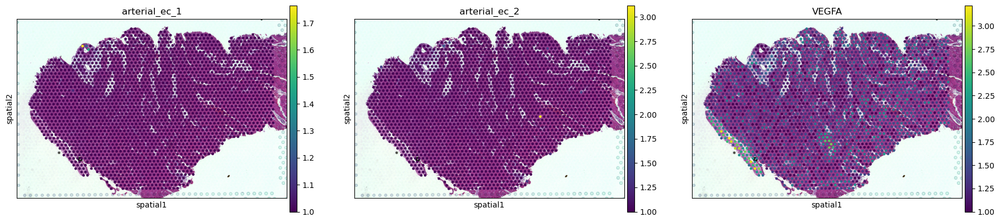

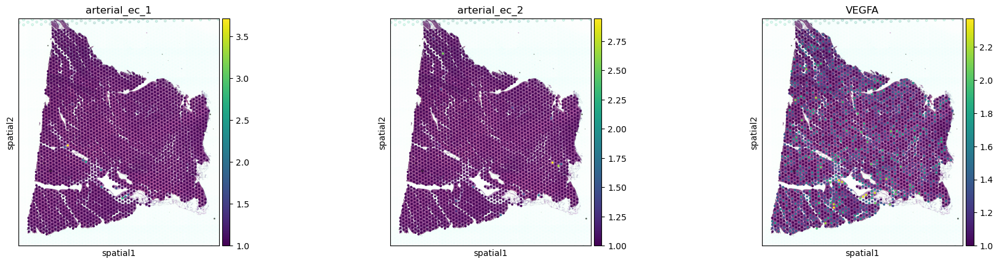

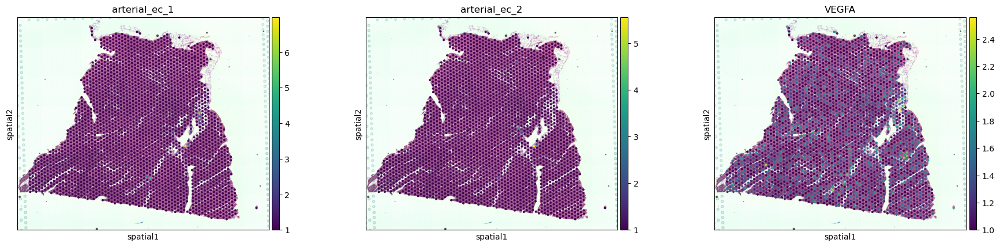

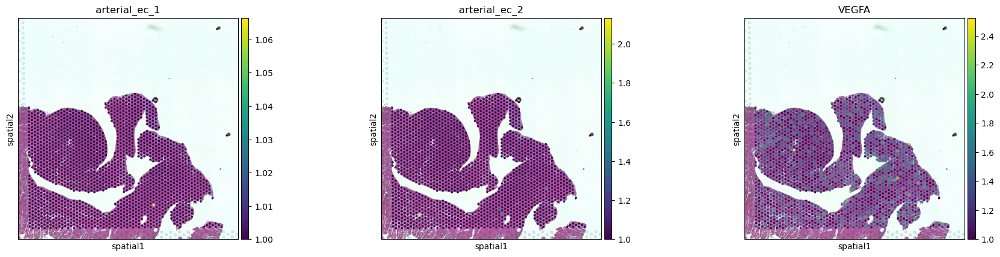

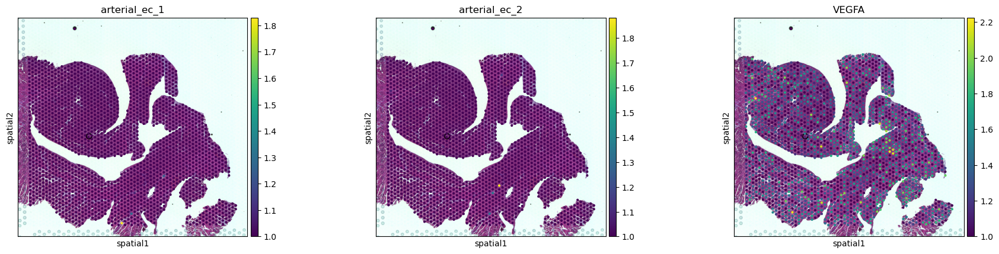

In [11]:
for library_id in ventricle_sc.obs['sample'].unique():
    sc.pl.spatial(ventricle_sc[ventricle_sc.obs['sample'] == library_id],
                  library_id=library_id, color=['arterial_ec_1', 'arterial_ec_2', 'VEGFA'], vmin=1)

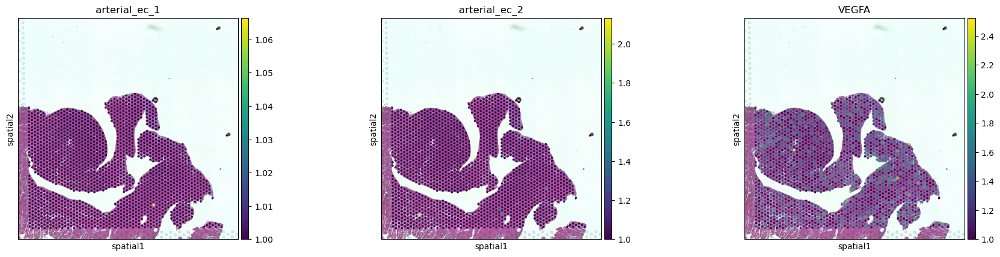

In [12]:
library_id = "RTR02-HHH2-LV-1-2"
sc.pl.spatial(ventricle_sc[ventricle_sc.obs['sample'] == library_id],
              library_id=library_id, color=['arterial_ec_1', 'arterial_ec_2', 'VEGFA'], vmin=1)

## specific regions in visium slides

In [13]:
from cell2location.utils import select_slide

In [14]:
slide = select_slide(ventricle_sc, s=library_id)

In [15]:
import squidpy as sq
img = sq.im.ImageContainer.from_adata(slide)

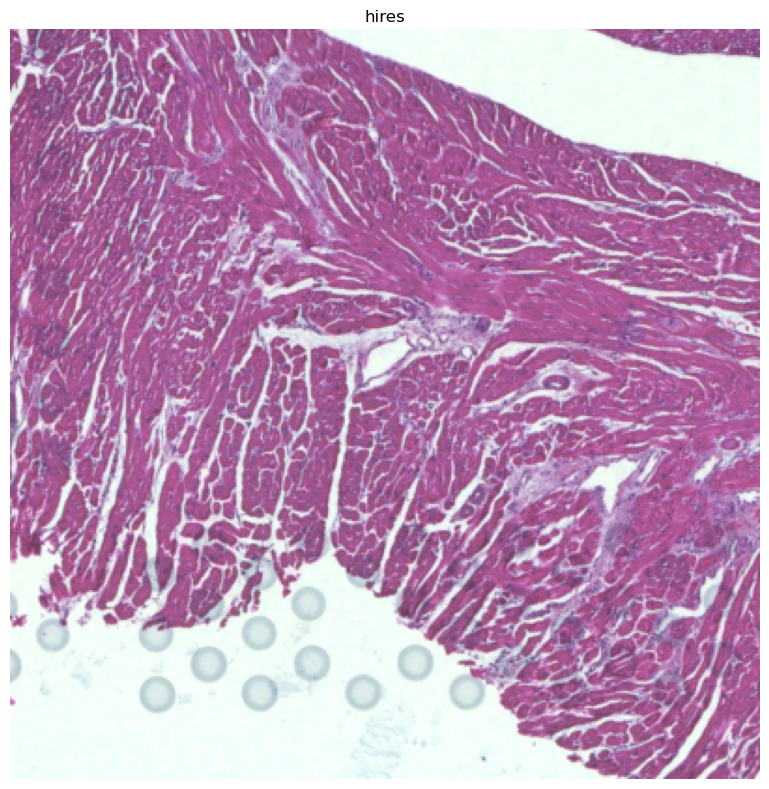

In [16]:
crop_conor = img.crop_center(1500, 500, radius=200)
crop_conor.show()

In [17]:
adata_crop = crop_conor.subset(slide)
adata_crop

View of AnnData object with n_obs × n_vars = 195 × 14068
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', '_indices', '_scvi_batch', '_scvi_labels', 'B_cells', 'Epithelial_cells', 'Fibroblasts', 'LEC', 'Myeloid_cells', 'T_cells/NKs/ILCs', 'arterial_ec_1', 'arterial_ec_2', 'arterial_smc', 'cap_cont_myo', 'capillary_pc', 'endocardium', 'vCM', 'venous_ec', 'venous_smc_pc', 'leiden', 'region_cluster', 'Annotation'
    var: 'ENSEMBL', 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-RTR02-HHH2-LV-1-1', 'mean_counts-RTR02-HHH2-LV-1-1', 'log1p_mean_counts-RTR02-HHH2-LV-1-1', 'pct_dropout_by_counts-RTR02-HHH2-LV-1-1', 'total_counts-RTR02-HHH2-LV-1-1', 'log1p_total_counts-RTR02-HHH2-LV-1-1', 'n_cells_by_counts-RTR02-HHH2-LV-1-2', 'mean_counts-RTR02-HHH2-LV-

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cellpymc/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


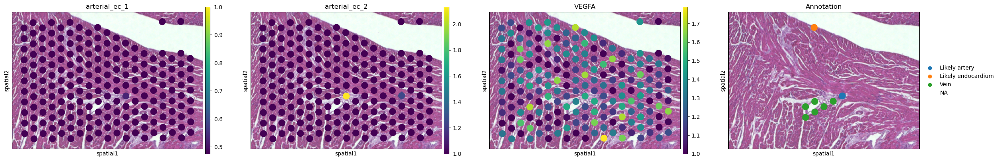

In [19]:
sc.pl.spatial(adata_crop, library_id=library_id, 
              color=['arterial_ec_1', 'arterial_ec_2', 'VEGFA', 'Annotation'], 
              vmin=1)

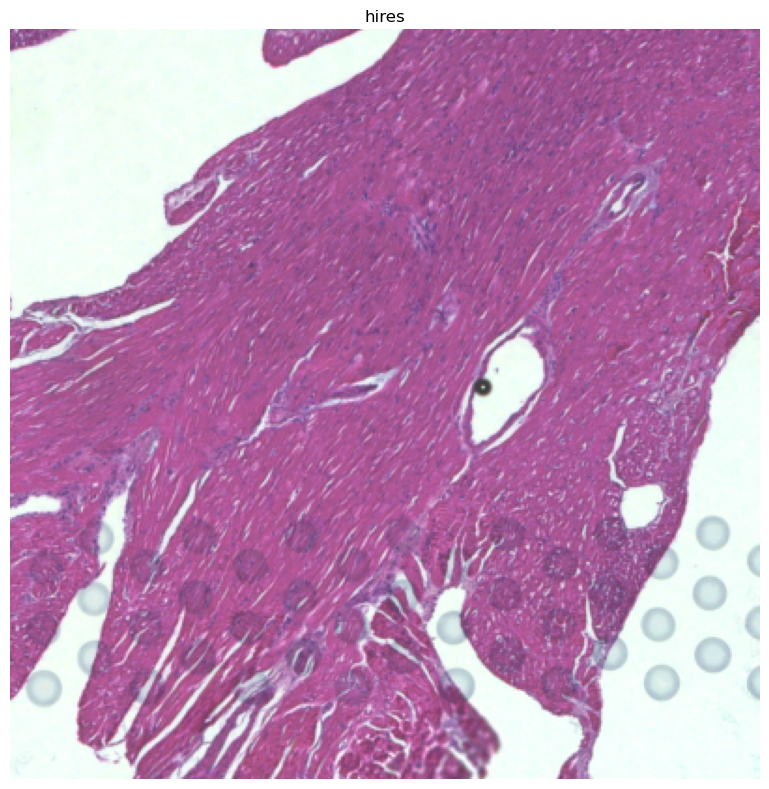

In [20]:
crop_conor2 = img.crop_center(1500, 1000, radius=200)
crop_conor2.show()

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cellpymc/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


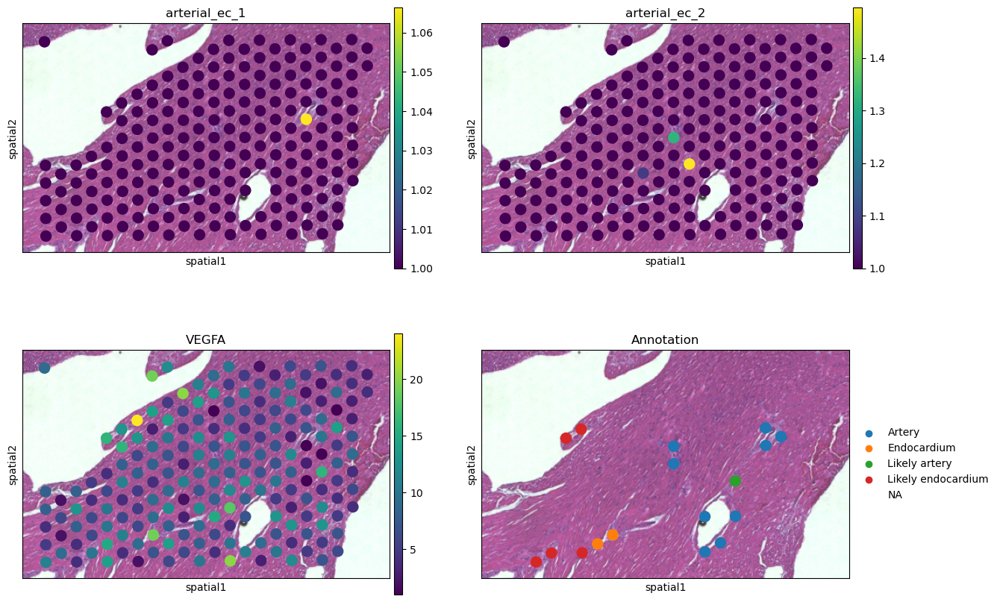

In [22]:
adata_crop2 = crop_conor2.subset(slide)
sc.pl.spatial(adata_crop2, library_id=library_id, 
              color=['arterial_ec_1', 'arterial_ec_2', 'VEGFA', 'Annotation'], 
              vmin=1, layer='counts', ncols=2)

In [ ]:
slide.uns['mod']['factor_names']

array(['B_cells', 'Epithelial_cells', 'Fibroblasts', 'LEC',
       'Myeloid_cells', 'T_cells/NKs/ILCs', 'arterial_ec_1',
       'arterial_ec_2', 'arterial_smc', 'cap_cont_myo', 'capillary_pc',
       'endocardium', 'vCM', 'venous_ec', 'venous_smc_pc'], dtype=object)

In [ ]:
slide[slide[:, 'VEGFA'].X.todense()>1.5].obs[slide.uns['mod']['factor_names']].sum(axis=0)/slide[slide[:, 'VEGFA'].X.todense()>1.5].obs[slide.uns['mod']['factor_names']].sum(axis=0).sum()

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


B_cells             0.120384
Epithelial_cells    0.111110
Fibroblasts         0.100722
LEC                 0.003337
Myeloid_cells       0.083723
T_cells/NKs/ILCs    0.019871
arterial_ec_1       0.006331
arterial_ec_2       0.012039
arterial_smc        0.030567
cap_cont_myo        0.089864
capillary_pc        0.033995
endocardium         0.015930
vCM                 0.325243
venous_ec           0.012795
venous_smc_pc       0.034090
dtype: float64

In [ ]:
slide.obs[slide.uns['mod']['factor_names']].sum(axis=0) / slide.obs[slide.uns['mod']['factor_names']].sum(axis=0).sum()

B_cells             0.127834
Epithelial_cells    0.111859
Fibroblasts         0.094986
LEC                 0.003680
Myeloid_cells       0.077795
T_cells/NKs/ILCs    0.019467
arterial_ec_1       0.007903
arterial_ec_2       0.013419
arterial_smc        0.033965
cap_cont_myo        0.097712
capillary_pc        0.037957
endocardium         0.013135
vCM                 0.316118
venous_ec           0.013611
venous_smc_pc       0.030559
dtype: float64

## Aggregates all art1 and art2 spots

In [23]:
art1_sc = ventricle_sc[(ventricle_sc.obs['arterial_ec_1']>1) & (ventricle_sc.obs['arterial_ec_2']<1)]
art2_sc = ventricle_sc[(ventricle_sc.obs['arterial_ec_1']<1) & (ventricle_sc.obs['arterial_ec_2']>1)]

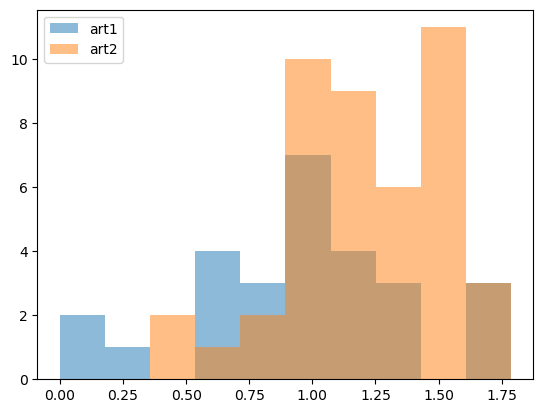

In [24]:
_, bins,_ = plt.hist(art1_sc[:, 'VEGFA'].X.todense(), alpha=0.5, bins=10, label='art1')
_ = plt.hist(art2_sc[:, 'VEGFA'].X.todense(), bins=bins, alpha=0.5, label='art2')
_ = plt.legend()

In [25]:
art1_ec_genes = 'SULF1,ABI3BP,FBLIM1,PTGIS,CLDN10,SRPX,ELN,BGN'.split(',')
art2_ec_genes = 'NEBL,VEGFA,LGALS3BP,CD36,ALPL,GPIHBP1,KDR,FABP4'.split(',')

In [27]:
for gene in art1_ec_genes:
    _, bins,_ = plt.hist(art1_sc[:, gene].X.todense(), alpha=0.5, bins=10, label='art1')
    _ = plt.hist(art2_sc[:, gene].X.todense(), bins=bins, alpha=0.5, label='art2')
    _ = plt.legend()
    _ = plt.title(gene)
    plt.show()

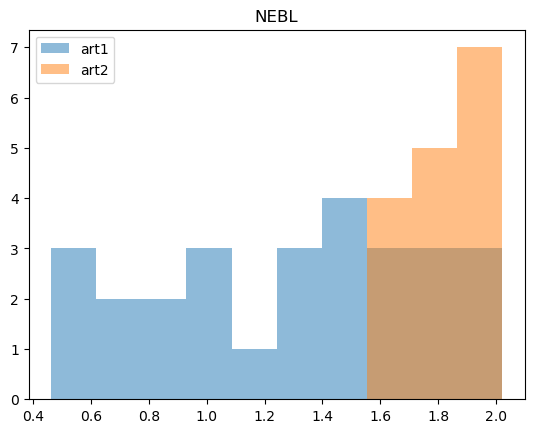

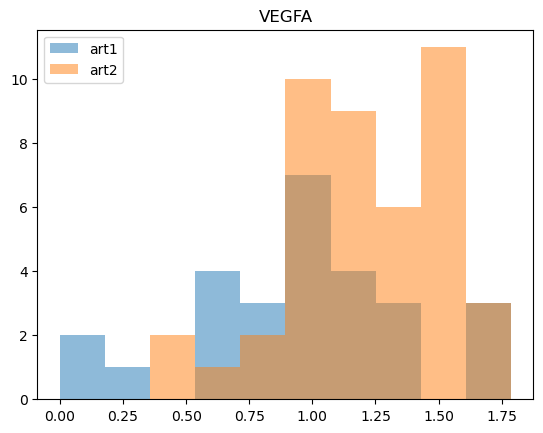

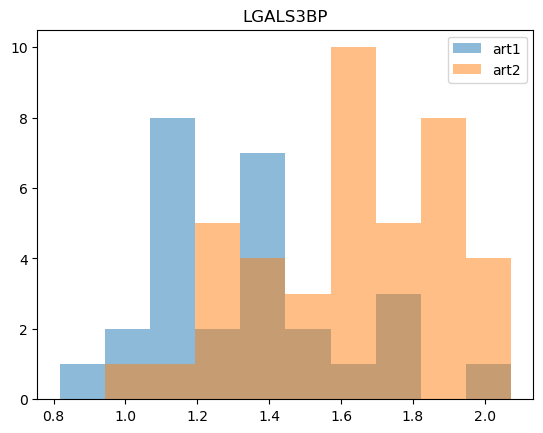

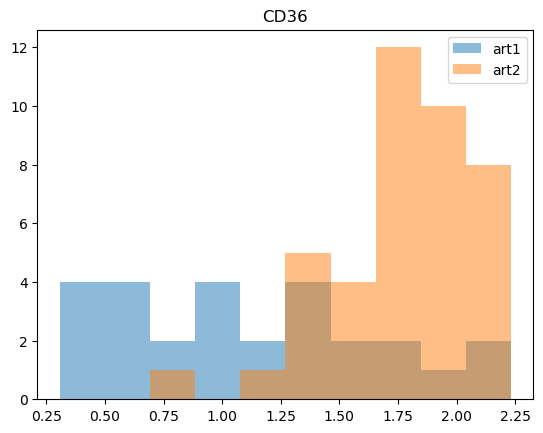

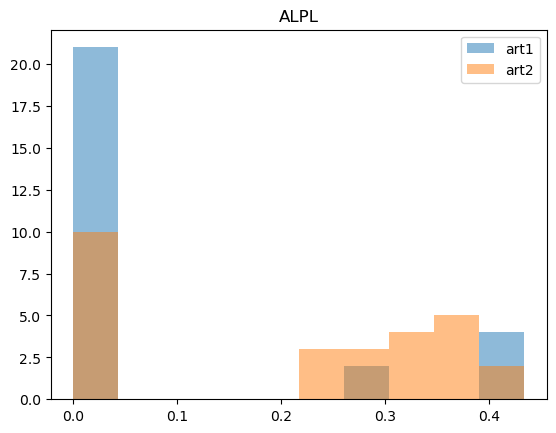

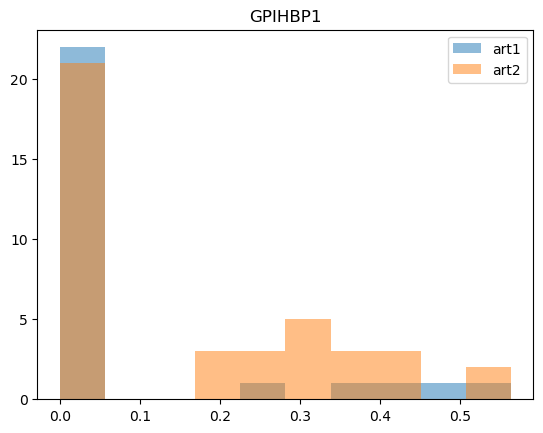

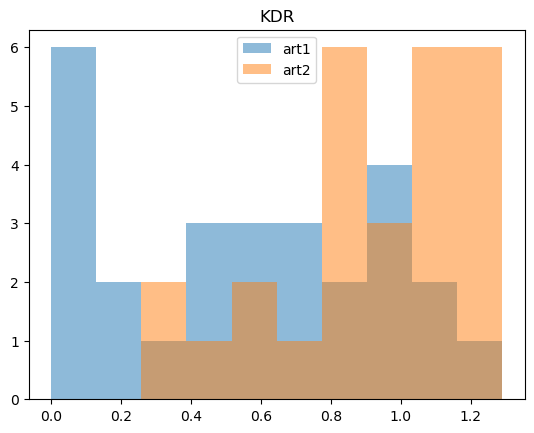

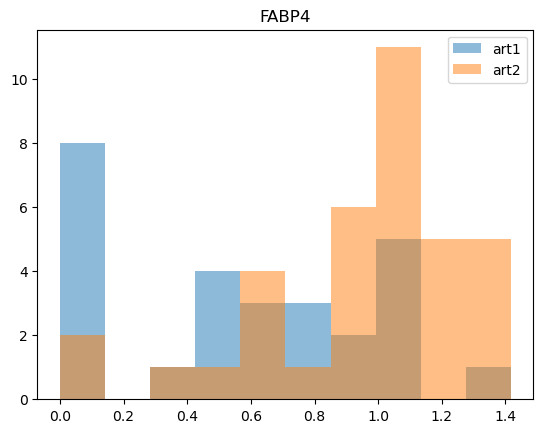

In [28]:
for gene in art2_ec_genes:
    _, bins,_ = plt.hist(art1_sc[:, gene].X.todense(), alpha=0.5, bins=10, label='art1')
    _ = plt.hist(art2_sc[:, gene].X.todense(), bins=bins, alpha=0.5, label='art2')
    _ = plt.legend()
    _ = plt.title(gene)
    plt.show()

In [46]:
def classify(celltype1, celltype2):
    if celltype1>1 and celltype2<1:
        return "art_ec_1"
    elif celltype1<1 and celltype2>1:
        return "art_ec_2"
    else:
        return np.nan
    
ventricle_sc.obs['art1_or_art2'] = [classify(celltype1, celltype2) for celltype1, celltype2 in 
                                    ventricle_sc.obs[['arterial_ec_1', 'arterial_ec_2']].values]

In [47]:
ventricle_sc.obs['art1_or_art2'].value_counts()

art_ec_2    45
art_ec_1    27
Name: art1_or_art2, dtype: int64

In [48]:
ventricle_sc.obs['art1_or_art2'] = ventricle_sc.obs['art1_or_art2'].astype('category')

In [51]:
pan_ecs = 'CDH5,VWF,PECAM1,SEMA3G,GJA5,DLL4'.split(',')

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cellpymc/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


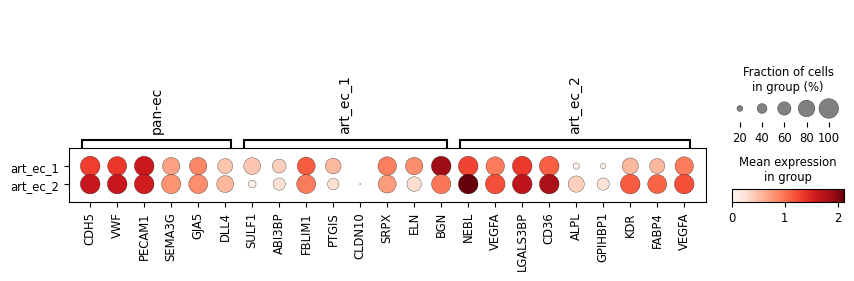

In [54]:
markers = {'pan-ec': pan_ecs,
           'art_ec_1': art1_ec_genes,
           'art_ec_2': art2_ec_genes + ['VEGFA']}
sc.pl.dotplot(ventricle_sc, 
              markers, 
              groupby='art1_or_art2', 
              dendrogram=False,
              save='art1_art2.pdf')

In [78]:
from scipy.stats import mannwhitneyu
gene = 'CDH5'
_, pval = mannwhitneyu(np.array(ventricle_sc[:, gene][ventricle_sc.obs['art1_or_art2'] == 'art_ec_1'].X.todense().flatten()),
         np.array(ventricle_sc[:, gene][ventricle_sc.obs['art1_or_art2'] == 'art_ec_2'].X.todense().flatten()),
         axis=1)
print(pval[0])

0.0013258110162430205


In [83]:
markers = {'pan-ec': pan_ecs,
           'art_ec_1': art1_ec_genes,
           'art_ec_2': art2_ec_genes + ['VEGFA']}

sig_res = []
for gene in pan_ecs + art1_ec_genes + art2_ec_genes + ['VEGFA']:
    _, pval = mannwhitneyu(np.array(ventricle_sc[:, gene][ventricle_sc.obs['art1_or_art2'] == 'art_ec_1'].X.todense().flatten()),
         np.array(ventricle_sc[:, gene][ventricle_sc.obs['art1_or_art2'] == 'art_ec_2'].X.todense().flatten()),
         axis=1)
    sig_res.append([gene, pval[0]])

In [90]:
sig_res_df = pd.DataFrame(data=sig_res,
                          columns=['gene', 'pval'])
sig_res_df['p_corrected'] = [min(1, p*sig_res_df.shape[0]) for p in sig_res_df['pval']]

def issig(x):
    if x < 0.05:
        return 'Sig'
    else:
        return 'Non-sig'
sig_res_df['isSig'] = [issig(x) for x in sig_res_df['p_corrected']]

In [93]:
sig_res_df.to_csv("art1_art2_gene_diff.csv", index=False)

In [96]:
# markers = {'pan-ec': pan_ecs,
#            'art_ec_1': art1_ec_genes,
#            'art_ec_2': art2_ec_genes + ['VEGFA']}
# sc.pl.dotplot(ventricle_sc, 
#               markers, 
#               groupby='art1_or_art2', 
#               dendrogram=False,
#               save='art1_art2.pdf')

plot_genenames = []
ventricle_copy = ventricle_sc.copy()
ventricle_copy.X = None
for gene in sig_res_df['gene']:
    pval = sig_res_df[sig_res_df['gene'] == gene]['p_corrected'].values[0]
    if pval <= 0.05:
        ventricle_copy.obs[f'{gene}*'] = ventricle_sc[:, gene].X.todense()
        plot_genenames.append(f'{gene}*')
    else:
        ventricle_copy.obs[f'{gene}'] = ventricle_sc[:, gene].X.todense()
        plot_genenames.append(f'{gene}')

In [100]:
ventricle_copy.var = ventricle_copy.var.set_index("ENSEMBL")

In [105]:
art1_ec_genes

['SULF1', 'ABI3BP', 'FBLIM1', 'PTGIS', 'CLDN10', 'SRPX', 'ELN', 'BGN']

In [103]:
plot_genenames

['CDH5*',
 'VWF',
 'PECAM1',
 'SEMA3G',
 'GJA5',
 'DLL4',
 'SULF1*',
 'ABI3BP',
 'FBLIM1',
 'PTGIS',
 'CLDN10',
 'SRPX',
 'ELN*',
 'BGN*',
 'NEBL*',
 'VEGFA',
 'LGALS3BP*',
 'CD36*',
 'ALPL*',
 'GPIHBP1',
 'KDR*',
 'FABP4*',
 'VEGFA']

In [107]:
marker_dic_updated = {"pan_ec": ['CDH5*',
 'VWF',
 'PECAM1',
 'SEMA3G',
 'GJA5',
 'DLL4'],
 "art_ec_1": ['SULF1*',
 'ABI3BP',
 'FBLIM1',
 'PTGIS',
 'CLDN10',
 'SRPX',
 'ELN*',
 'BGN*'],
  "art_ec_2": ['NEBL*',
 'VEGFA',
 'LGALS3BP*',
 'CD36*',
 'ALPL*',
 'GPIHBP1',
 'KDR*',
 'FABP4*',
 'VEGFA']}

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cellpymc/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


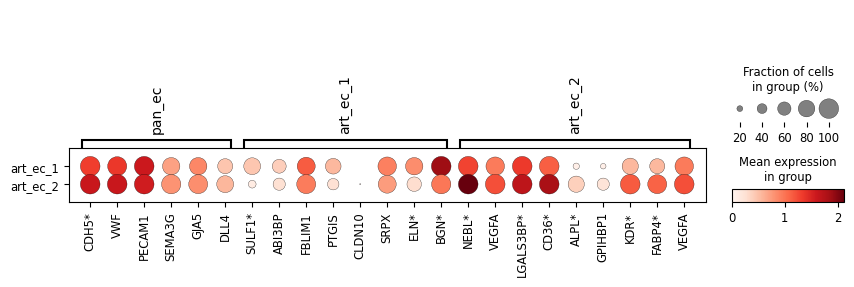

In [108]:
sc.pl.dotplot(ventricle_copy, 
              marker_dic_updated, 
              groupby='art1_or_art2', 
              dendrogram=False,
              save='art1_art2_withsig.pdf')